In [1]:
import numpy as np
import pandas as pd
import os as os


In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import SGD

# Path to the main directory containing subdirectories for each class
data_dir = '/kaggle/input/ham-10000balanced/train_dir'

# Loading images
BATCH_SIZE = 32
IMG_SIZE = (224, 224)  # Standard for EfficientNetB0; adjust if using a larger EfficientNet version

train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)


Found 25800 images belonging to 7 classes.
Found 25800 images belonging to 7 classes.


In [3]:
import os

# Path to the main directory containing class subdirectories
main_directory = '/kaggle/input/ham-10000balanced/train_dir'

# Dictionary to store the count of images in each class subdirectory
class_image_count = {}

# Loop through each subdirectory in the main directory
for class_name in os.listdir(main_directory):
    class_path = os.path.join(main_directory, class_name)
    
    # Check if the path is a directory (in case there are any non-directory files)
    if os.path.isdir(class_path):
        # Count the number of image files in the subdirectory
        image_count = len([img for img in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, img))])
        class_image_count[class_name] = image_count

# Display the results
for class_name, count in class_image_count.items():
    print(f"Class '{class_name}': {count} images")


Class 'mel': 3900 images
Class 'vasc': 3500 images
Class 'df': 2900 images
Class 'nv': 4000 images
Class 'bkl': 3800 images
Class 'akiec': 3900 images
Class 'bcc': 3800 images


In [4]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Load EfficientNet without the top layer
base_model = EfficientNetB0(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

# Freeze the base model
for layer in base_model.layers:
    layer.trainable = True

x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(train_generator.num_classes, activation='softmax')(x)

# Define the full model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model with SGD optimizer
model.compile(
    optimizer=SGD(learning_rate=0.006, momentum=0.9),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [3]:
from tensorflow.keras.callbacks import EarlyStopping

In [4]:
callbacks = [
    # Stop training when the validation loss has not improved for 5 epochs
    EarlyStopping(
        monitor='val_loss',  # Metric to monitor (usually 'val_loss' or 'val_accuracy')
        patience=5,          # Number of epochs with no improvement after which training will be stopped
        restore_best_weights=True,  # Restore model weights from the epoch with the best value of the monitored metric
        verbose=1
    )]

In [7]:
# Train the model
history = model.fit(train_generator, validation_data=val_generator, epochs=30,callbacks=callbacks  )


Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1730738001.188837     106 service.cc:145] XLA service 0x7b5a78002a90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730738001.188887     106 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  1/807 ━━━━━━━━━━━━━━━━━━━━ 13:41:02 61s/step - accuracy: 0.2188 - loss: 1.9814

I0000 00:00:1730738038.485112     106 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


426/807 ━━━━━━━━━━━━━━━━━━━━ 2:17 362ms/step - accuracy: 0.6205 - loss: 1.0177

I0000 00:00:1730738192.308339     107 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 36 bytes spill stores, 36 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 36 bytes spill stores, 36 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_4', 36 bytes spill stores, 36 bytes spill loads



807/807 ━━━━━━━━━━━━━━━━━━━━ 402s 423ms/step - accuracy: 0.6958 - loss: 0.8214 - val_accuracy: 0.4939 - val_loss: 1.4214
Epoch 2/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 169s 209ms/step - accuracy: 0.9248 - loss: 0.2189 - val_accuracy: 0.9385 - val_loss: 0.1820
Epoch 3/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 181s 224ms/step - accuracy: 0.9540 - loss: 0.1310 - val_accuracy: 0.7784 - val_loss: 0.5862
Epoch 4/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 179s 221ms/step - accuracy: 0.9696 - loss: 0.0889 - val_accuracy: 0.9673 - val_loss: 0.0947
Epoch 5/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 175s 216ms/step - accuracy: 0.9781 - loss: 0.0639 - val_accuracy: 0.9682 - val_loss: 0.0848
Epoch 6/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 235s 290ms/step - accuracy: 0.9841 - loss: 0.0467 - val_accuracy: 0.9753 - val_loss: 0.0712
Epoch 7/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 183s 227ms/step - accuracy: 0.9883 - loss: 0.0363 - val_accuracy: 0.9633 - val_loss: 0.1006
Epoch 8/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 176s 218ms/step - accuracy: 0.9898 - loss: 0.03

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



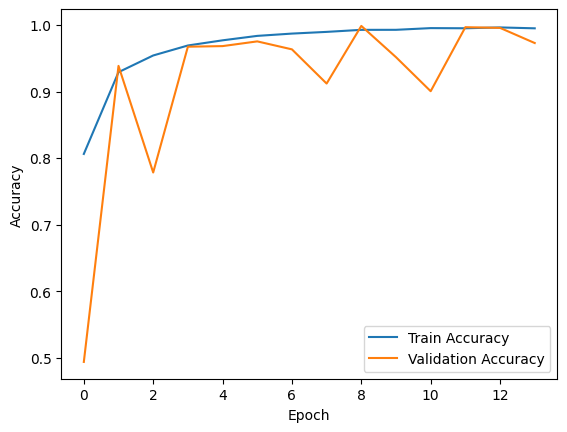

In [13]:
import matplotlib.pyplot as plt

# Plotting accuracy
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_dir = "/kaggle/input/ham-10000balanced/test_dir"


# Load the test dataset
img_size = (224, 224)  # Adjust to your model's input size
batch_size = 32

test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',  # Adjust to 'categorical' if using one-hot labels
    shuffle=False
)

Found 1103 images belonging to 7 classes.


In [18]:
test_loss,test_accuracy= model.evaluate(test_generator)



35/35 ━━━━━━━━━━━━━━━━━━━━ 7s 211ms/step - accuracy: 0.8388 - loss: 0.7629


In [19]:
print(test_loss)
print(test_accuracy)

0.3481840491294861
0.9184043407440186


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


35/35 ━━━━━━━━━━━━━━━━━━━━ 26s 602ms/step


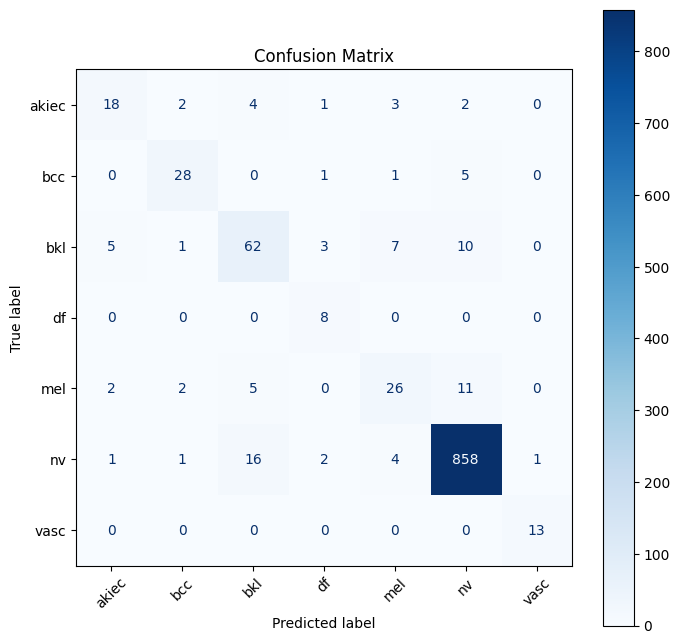

In [12]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
true_labels = test_generator.classes
pred_probs = model.predict(test_generator, steps=test_generator.samples // batch_size + 1)
pred_labels = np.argmax(pred_probs, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(true_labels, pred_labels)

# Plot the confusion matrix
fig, ax = plt.subplots(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_generator.class_indices.keys())
disp.plot(ax=ax, cmap='Blues', xticks_rotation=45)
plt.title("Confusion Matrix")
plt.show()

In [20]:
model.save("efficient_net.h5")

**efficient net with attention mechanism**

In [1]:
import numpy as np
import pandas as pd
import os as os


In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import SGD

# Path to the main directory containing subdirectories for each class
data_dir = '/kaggle/input/ham-10000balanced/train_dir'

# Loading images
BATCH_SIZE = 32
IMG_SIZE = (224, 224)  # Standard for EfficientNetB0; adjust if using a larger EfficientNet version

train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)
val_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)


Found 25800 images belonging to 7 classes.
Found 25800 images belonging to 7 classes.


In [3]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0

# Define the Squeeze-and-Excitation (SE) Layer
class SqueezeExcite(layers.Layer):
    def __init__(self, in_channels, reduction_ratio=16, **kwargs):
        super(SqueezeExcite, self).__init__(**kwargs)
        self.in_channels = in_channels
        self.reduction_ratio = reduction_ratio
        self.global_avg_pool = layers.GlobalAveragePooling2D()
        self.dense1 = layers.Dense(in_channels // reduction_ratio, activation='relu')
        self.dense2 = layers.Dense(in_channels, activation='sigmoid')

    def call(self, x):
        # Global Average Pooling
        se = self.global_avg_pool(x)
        se = tf.expand_dims(tf.expand_dims(se, 1), 1)  # Add back spatial dimensions for broadcasting
        # Two fully connected layers with a ReLU and sigmoid
        se = self.dense1(se)
        se = self.dense2(se)
        return x * se  # Scale the input by the channel attention map

    def get_config(self):
        config = super(SqueezeExcite, self).get_config()
        config.update({
            "in_channels": self.in_channels,
            "reduction_ratio": self.reduction_ratio
        })
        return config


In [4]:
# Load the pretrained EfficientNet model without the top classifier layer
base_model = EfficientNetB0(include_top=False, weights="imagenet", input_shape=(224, 224, 3))

# Find the last Conv2D layer to get the number of output channels
sample_input = tf.keras.Input(shape=(224, 224, 3))
feature_map = base_model(sample_input)
in_channels = feature_map.shape[-1]


print("Number of channels in the last convolutional layer:", in_channels)


# Define the model
def EfficientNet_with_SE(num_classes, reduction_ratio=16):
    inputs = tf.keras.Input(shape=(224, 224, 3))

    # Extract features with EfficientNet base
    x = base_model(inputs, training=False)

    # Add SE layer
    x = SqueezeExcite(in_channels, reduction_ratio=reduction_ratio)(x)

    # Global Average Pooling
    x = layers.GlobalAveragePooling2D()(x)

    # Fully connected layer for classification
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    # Create the model
    model = models.Model(inputs, outputs)
    return model

# Instantiate the modified EfficientNet with SE
num_classes = 7  # Assuming 1000 classes for ImageNet; adjust as needed
model = EfficientNet_with_SE(num_classes=num_classes)

# Check the model summary
model.summary()


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Number of channels in the last convolutional layer: 1280


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ squeeze_excite (SqueezeExcite)  │ (None, 7, 7, 1280)     │       206,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 7)              │         8,967 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,264,698 (16.27 MB)

 Trainable params: 4,222,675 (16.11 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [5]:
# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [6]:
from tensorflow.keras.callbacks import EarlyStopping

In [7]:
callbacks = [
    # Stop training when the validation loss has not improved for 5 epochs
    EarlyStopping(
        monitor='val_loss',  # Metric to monitor (usually 'val_loss' or 'val_accuracy')
        patience=7,          # Number of epochs with no improvement after which training will be stopped
        restore_best_weights=True,  # Restore model weights from the epoch with the best value of the monitored metric
        verbose=1
    )]

In [8]:
history=model.fit(train_generator,validation_data=val_generator,epochs=30,callbacks=callbacks)

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1731240433.279198     111 service.cc:145] XLA service 0x7cb708004730 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731240433.279256     111 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  1/807 ━━━━━━━━━━━━━━━━━━━━ 18:22:57 82s/step - accuracy: 0.1250 - loss: 2.0156

I0000 00:00:1731240479.275510     111 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


669/807 ━━━━━━━━━━━━━━━━━━━━ 32s 236ms/step - accuracy: 0.6532 - loss: 1.0066

I0000 00:00:1731240637.118480     108 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 36 bytes spill stores, 36 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 36 bytes spill stores, 36 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_4', 36 bytes spill stores, 36 bytes spill loads



807/807 ━━━━━━━━━━━━━━━━━━━━ 349s 331ms/step - accuracy: 0.6754 - loss: 0.9403 - val_accuracy: 0.7409 - val_loss: 0.7986
Epoch 2/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 179s 221ms/step - accuracy: 0.9207 - loss: 0.2222 - val_accuracy: 0.9718 - val_loss: 0.0811
Epoch 3/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 177s 218ms/step - accuracy: 0.9547 - loss: 0.1300 - val_accuracy: 0.9823 - val_loss: 0.0500
Epoch 4/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 170s 210ms/step - accuracy: 0.9723 - loss: 0.0803 - val_accuracy: 0.9928 - val_loss: 0.0257
Epoch 5/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 177s 219ms/step - accuracy: 0.9792 - loss: 0.0605 - val_accuracy: 0.9967 - val_loss: 0.0129
Epoch 6/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 175s 216ms/step - accuracy: 0.9848 - loss: 0.0453 - val_accuracy: 0.9984 - val_loss: 0.0097
Epoch 7/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 176s 217ms/step - accuracy: 0.9861 - loss: 0.0410 - val_accuracy: 0.9979 - val_loss: 0.0074
Epoch 8/30
807/807 ━━━━━━━━━━━━━━━━━━━━ 176s 217ms/step - accuracy: 0.9887 - loss: 0.03

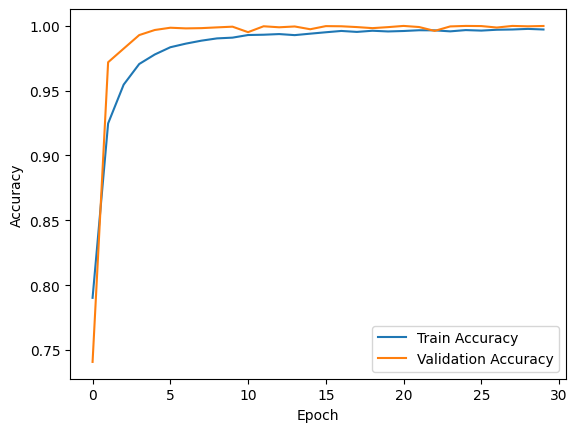

In [10]:
import matplotlib.pyplot as plt

# Plotting accuracy
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [11]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_dir = "/kaggle/input/ham-10000balanced/test_dir"


# Load the test dataset
img_size = (224, 224)  # Adjust to your model's input size
batch_size = 32

test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',  # Adjust to 'categorical' if using one-hot labels
    shuffle=False
)

Found 1103 images belonging to 7 classes.


In [12]:
test_loss,test_accuracy= model.evaluate(test_generator)


35/35 ━━━━━━━━━━━━━━━━━━━━ 17s 479ms/step - accuracy: 0.8501 - loss: 0.9991


35/35 ━━━━━━━━━━━━━━━━━━━━ 16s 340ms/step


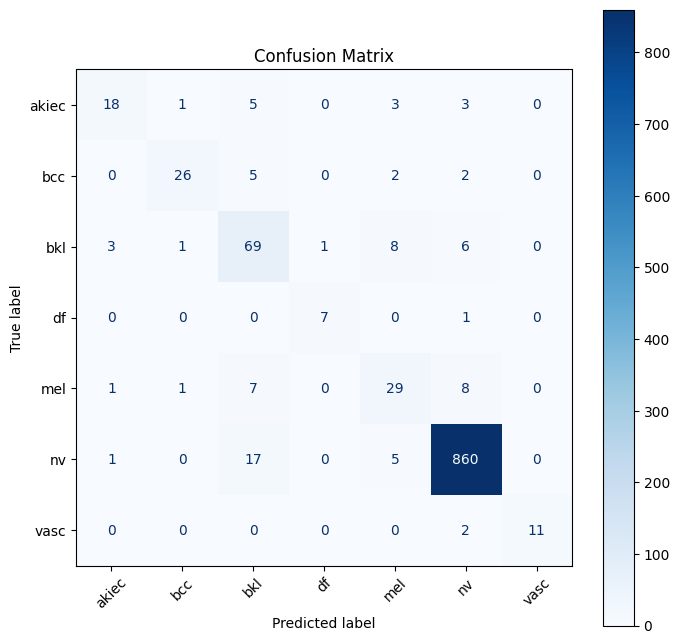

In [13]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
true_labels = test_generator.classes
pred_probs = model.predict(test_generator, steps=test_generator.samples // batch_size + 1)
pred_labels = np.argmax(pred_probs, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(true_labels, pred_labels)

# Plot the confusion matrix
fig, ax = plt.subplots(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_generator.class_indices.keys())
disp.plot(ax=ax, cmap='Blues', xticks_rotation=45)
plt.title("Confusion Matrix")
plt.show()

**using mobilenet**

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import os

# Paths to training and validation directories
train_dir = '/kaggle/input/ham-10000balanced/train_dir'  # Specify the path to your train directory


# MobileNet image input size
IMG_SIZE = 224
BATCH_SIZE = 64
EPOCHS = 70

# Data augmentation for training set
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    validation_split=0.2
)



# Data generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Load the MobileNet model with pretrained ImageNet weights
base_model = MobileNet(input_shape=(IMG_SIZE, IMG_SIZE, 3), include_top=False, weights='imagenet')

# Freeze the base model layers
base_model.trainable = True

# Add custom layers on top of MobileNet
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(train_generator.num_classes, activation='softmax')(x)

# Define the full model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])



Found 25800 images belonging to 7 classes.
Found 25800 images belonging to 7 classes.
17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [3]:
# Model training
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=20,
    validation_data=val_generator,
    validation_steps=val_generator.samples // BATCH_SIZE
)



Epoch 1/20
403/403 ━━━━━━━━━━━━━━━━━━━━ 207s 509ms/step - accuracy: 0.9074 - loss: 0.2765 - val_accuracy: 0.8951 - val_loss: 0.3055
Epoch 2/20
403/403 ━━━━━━━━━━━━━━━━━━━━ 0s 67us/step - accuracy: 0.9062 - loss: 0.2824 - val_accuracy: 1.0000 - val_loss: 0.1335
Epoch 3/20
403/403 ━━━━━━━━━━━━━━━━━━━━ 206s 507ms/step - accuracy: 0.9267 - loss: 0.2154 - val_accuracy: 0.8337 - val_loss: 0.5502
Epoch 4/20
403/403 ━━━━━━━━━━━━━━━━━━━━ 0s 68us/step - accuracy: 0.9219 - loss: 0.2027 - val_accuracy: 0.8750 - val_loss: 0.2492
Epoch 5/20
403/403 ━━━━━━━━━━━━━━━━━━━━ 209s 515ms/step - accuracy: 0.9361 - loss: 0.1810 - val_accuracy: 0.8536 - val_loss: 0.3997
Epoch 6/20
403/403 ━━━━━━━━━━━━━━━━━━━━ 0s 68us/step - accuracy: 0.9688 - loss: 0.1380 - val_accuracy: 1.0000 - val_loss: 0.0677
Epoch 7/20
403/403 ━━━━━━━━━━━━━━━━━━━━ 205s 506ms/step - accuracy: 0.9439 - loss: 0.1662 - val_accuracy: 0.9055 - val_loss: 0.3045
Epoch 8/20
403/403 ━━━━━━━━━━━━━━━━━━━━ 0s 66us/step - accuracy: 0.9062 - loss: 0.263

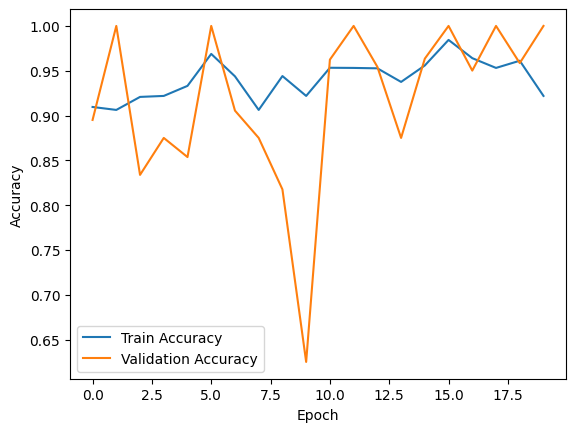

In [4]:
import matplotlib.pyplot as plt

# Plotting accuracy
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_dir = "/kaggle/input/ham-10000balanced/test_dir"


# Load the test dataset
img_size = (224, 224)  # Adjust to your model's input size
batch_size = 32

test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='sparse',  # Adjust to 'categorical' if using one-hot labels
    shuffle=False
)

Found 1103 images belonging to 7 classes.


In [10]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step


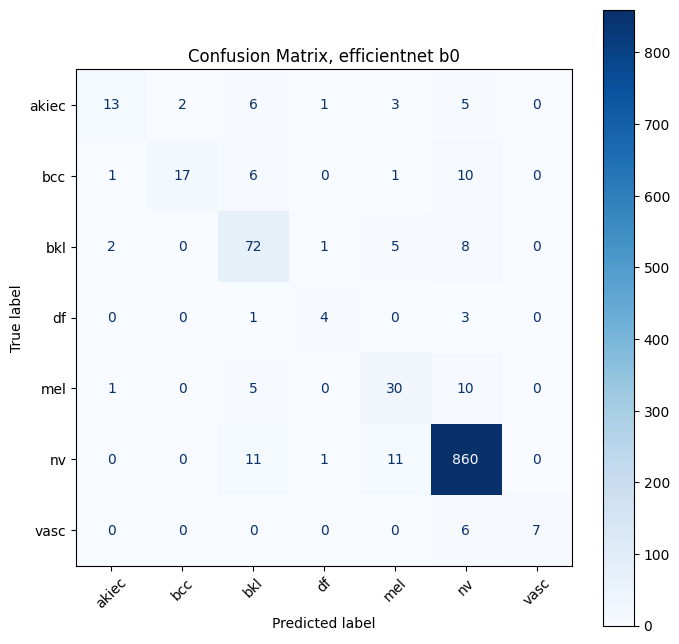

In [11]:
true_labels = test_generator.classes
pred_probs = model.predict(test_generator, steps=test_generator.samples // batch_size + 1)
pred_labels = np.argmax(pred_probs, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(true_labels, pred_labels)

# Plot the confusion matrix
fig, ax = plt.subplots(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_generator.class_indices.keys())
disp.plot(ax=ax, cmap='Blues', xticks_rotation=45)
plt.title("Confusion Matrix, efficientnet b0")
plt.show()

In [ ]:
# Save the trained model
model.save('mobilenet_ham10000.h5')

**DENSE NET 210**

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD

# Paths to training and validation directories
train_dir = '/kaggle/input/ham-10000balanced/train_dir'  # Specify the path to your train directory
val_dir = '/kaggle/input/ham-10000balanced/test_dir'      # Specify the path to your validation directory

# DenseNet201 input size
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 20

# Data augmentation for training set
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    validation_split=0.2
    
)

# Only rescaling for validation set


# Data generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Load DenseNet201 with pretrained weights from ImageNet
base_model = DenseNet201(input_shape=(IMG_SIZE, IMG_SIZE, 3), include_top=False, weights='imagenet')

# Freeze the base model layers
base_model.trainable = True

# Add custom classification layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(train_generator.num_classes, activation='softmax')(x)

# Define the full model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model with SGD optimizer
model.compile(
    optimizer=SGD(learning_rate=0.006, momentum=0.9),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)





Found 25800 images belonging to 7 classes.
Found 25800 images belonging to 7 classes.
74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [3]:
# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=val_generator,
    validation_steps=val_generator.samples // BATCH_SIZE
)

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1730364680.706385     121 service.cc:145] XLA service 0x7aa0752a8790 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730364680.706449     121 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1730364841.473734     121 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_50', 8 bytes spill stores, 48 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_51', 4 bytes spill stores, 28 bytes spill loads
pt

146/806 ━━━━━━━━━━━━━━━━━━━━ 3:09 288ms/step - accuracy: 0.5648 - loss: 1.1681

2024-10-31 08:57:40.986815: E external/local_xla/xla/service/slow_operation_alarm.cc:65] 
********************************
[Compiling module a_inference_one_step_on_data_84339__.71639] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
I0000 00:00:1730365080.986677     120 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_19', 4 bytes spill stores, 4 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_20', 4 bytes spill stores, 4 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_21', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_22', 12 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 

806/806 ━━━━━━━━━━━━━━━━━━━━ 0s 531ms/step - accuracy: 0.7134 - loss: 0.7848

I0000 00:00:1730365284.718505     121 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 8 bytes spill stores, 8 bytes spill loads



806/806 ━━━━━━━━━━━━━━━━━━━━ 754s 656ms/step - accuracy: 0.7135 - loss: 0.7845 - val_accuracy: 0.5943 - val_loss: 1.2633
Epoch 2/20
  1/806 ━━━━━━━━━━━━━━━━━━━━ 4:01 300ms/step - accuracy: 0.8750 - loss: 0.2121

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


806/806 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.8750 - loss: 0.2121 - val_accuracy: 0.5000 - val_loss: 1.9012
Epoch 3/20


I0000 00:00:1730365380.076433     120 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 8 bytes spill stores, 8 bytes spill loads



806/806 ━━━━━━━━━━━━━━━━━━━━ 348s 381ms/step - accuracy: 0.9174 - loss: 0.2272 - val_accuracy: 0.8635 - val_loss: 0.4135
Epoch 4/20
806/806 ━━━━━━━━━━━━━━━━━━━━ 0s 94us/step - accuracy: 0.8750 - loss: 0.4922 - val_accuracy: 1.0000 - val_loss: 0.1151
Epoch 5/20
806/806 ━━━━━━━━━━━━━━━━━━━━ 312s 387ms/step - accuracy: 0.9487 - loss: 0.1415 - val_accuracy: 0.8194 - val_loss: 0.5692
Epoch 6/20
806/806 ━━━━━━━━━━━━━━━━━━━━ 0s 99us/step - accuracy: 1.0000 - loss: 0.0466 - val_accuracy: 0.8750 - val_loss: 0.3747
Epoch 7/20
806/806 ━━━━━━━━━━━━━━━━━━━━ 309s 383ms/step - accuracy: 0.9607 - loss: 0.1064 - val_accuracy: 0.8717 - val_loss: 0.3976
Epoch 8/20
806/806 ━━━━━━━━━━━━━━━━━━━━ 0s 105us/step - accuracy: 0.9375 - loss: 0.2269 - val_accuracy: 0.7500 - val_loss: 1.0993
Epoch 9/20
806/806 ━━━━━━━━━━━━━━━━━━━━ 308s 382ms/step - accuracy: 0.9774 - loss: 0.0639 - val_accuracy: 0.6182 - val_loss: 1.2017
Epoch 10/20
806/806 ━━━━━━━━━━━━━━━━━━━━ 0s 96us/step - accuracy: 0.9375 - loss: 0.2638 - val_a

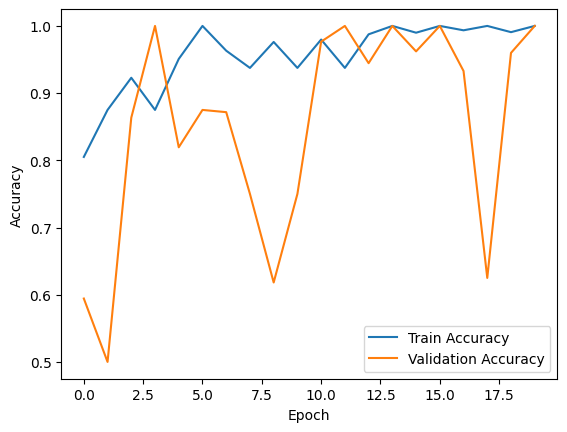

In [4]:
import matplotlib.pyplot as plt

# Plotting accuracy
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_dir = "/kaggle/input/ham-10000balanced/test_dir"


# Load the test dataset
img_size = (224, 224)  # Adjust to your model's input size
batch_size = 32

test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='sparse',  # Adjust to 'categorical' if using one-hot labels
    shuffle=False
)

Found 1103 images belonging to 7 classes.


In [9]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

35/35 ━━━━━━━━━━━━━━━━━━━━ 7s 207ms/step


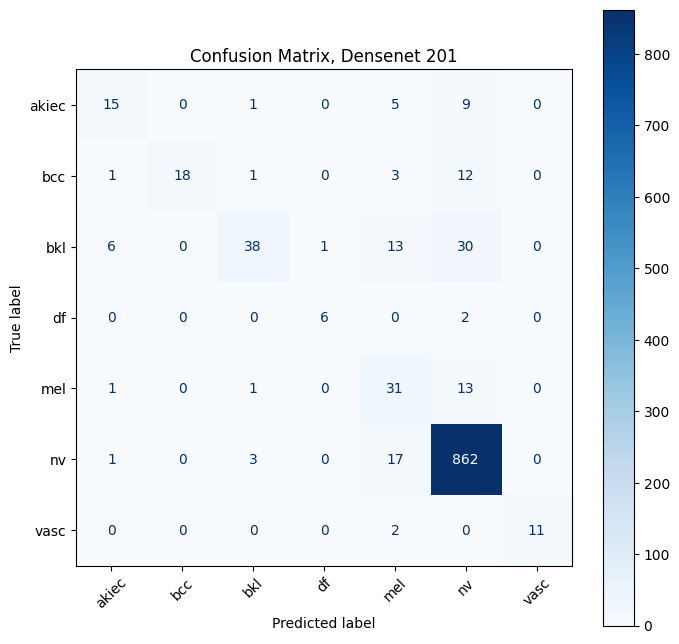

In [11]:
true_labels = test_generator.classes
pred_probs = model.predict(test_generator, steps=test_generator.samples // batch_size + 1)
pred_labels = np.argmax(pred_probs, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(true_labels, pred_labels)

# Plot the confusion matrix
fig, ax = plt.subplots(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_generator.class_indices.keys())
disp.plot(ax=ax, cmap='Blues', xticks_rotation=45)
plt.title("Confusion Matrix, Densenet 201")
plt.show()

In [ ]:
# Save the trained model
model.save('densenet201_ham10000.h5')

**Ressnet 50**

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD

In [2]:
# Set paths to your training and validation data directories
train_dir = '/kaggle/input/ham-10000balanced/train_dir'

# Define image size and batch size
img_size = (224, 224)
batch_size = 32

# Create data generators with data augmentation for the training set
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.3
)
# Load data from directories
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)


Found 25800 images belonging to 7 classes.
Found 25800 images belonging to 7 classes.


In [3]:
# Load the ResNet50 model, excluding the top layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
base_model.trainable = True

# Add custom layers on top
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(train_generator.num_classes, activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [4]:
model.compile(optimizer=SGD(learning_rate=0.006, momentum=0.9),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [5]:
# Train the model
history = model.fit(
    train_generator,
    epochs=25,
    validation_data=val_generator
)


Epoch 1/25


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1730565828.788318     110 service.cc:145] XLA service 0x7bcb4c004270 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730565828.788383     110 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  1/807 ━━━━━━━━━━━━━━━━━━━━ 9:02:06 40s/step - accuracy: 0.1562 - loss: 2.4487

I0000 00:00:1730565848.491004     110 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


805/807 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - accuracy: 0.6986 - loss: 0.8198

I0000 00:00:1730566040.194096     111 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_add_reduce_fusion_28', 456 bytes spill stores, 456 bytes spill loads



807/807 ━━━━━━━━━━━━━━━━━━━━ 316s 342ms/step - accuracy: 0.6989 - loss: 0.8189 - val_accuracy: 0.1850 - val_loss: 3.0950
Epoch 2/25
807/807 ━━━━━━━━━━━━━━━━━━━━ 199s 246ms/step - accuracy: 0.9090 - loss: 0.2481 - val_accuracy: 0.7134 - val_loss: 0.7853
Epoch 3/25
807/807 ━━━━━━━━━━━━━━━━━━━━ 196s 241ms/step - accuracy: 0.9487 - loss: 0.1379 - val_accuracy: 0.7931 - val_loss: 0.6732
Epoch 4/25
807/807 ━━━━━━━━━━━━━━━━━━━━ 195s 240ms/step - accuracy: 0.9697 - loss: 0.0850 - val_accuracy: 0.5716 - val_loss: 2.3921
Epoch 5/25
807/807 ━━━━━━━━━━━━━━━━━━━━ 196s 242ms/step - accuracy: 0.9740 - loss: 0.0726 - val_accuracy: 0.8964 - val_loss: 0.3533
Epoch 6/25
807/807 ━━━━━━━━━━━━━━━━━━━━ 195s 241ms/step - accuracy: 0.9845 - loss: 0.0432 - val_accuracy: 0.5643 - val_loss: 2.3948
Epoch 7/25
807/807 ━━━━━━━━━━━━━━━━━━━━ 197s 243ms/step - accuracy: 0.9900 - loss: 0.0284 - val_accuracy: 0.8717 - val_loss: 0.3935
Epoch 8/25
807/807 ━━━━━━━━━━━━━━━━━━━━ 196s 242ms/step - accuracy: 0.9919 - loss: 0.02

In [15]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_dir = "/kaggle/input/ham-10000balanced/test_dir"


# Load the test dataset
img_size = (224, 224)  # Adjust to your model's input size
batch_size = 32

test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',  # Adjust to 'categorical' if using one-hot labels
    shuffle=False
)

Found 1103 images belonging to 7 classes.


In [17]:
# Evaluate on the validation set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy:.2f}")


35/35 ━━━━━━━━━━━━━━━━━━━━ 8s 220ms/step - accuracy: 0.8431 - loss: 1.1297
Test Accuracy: 0.92


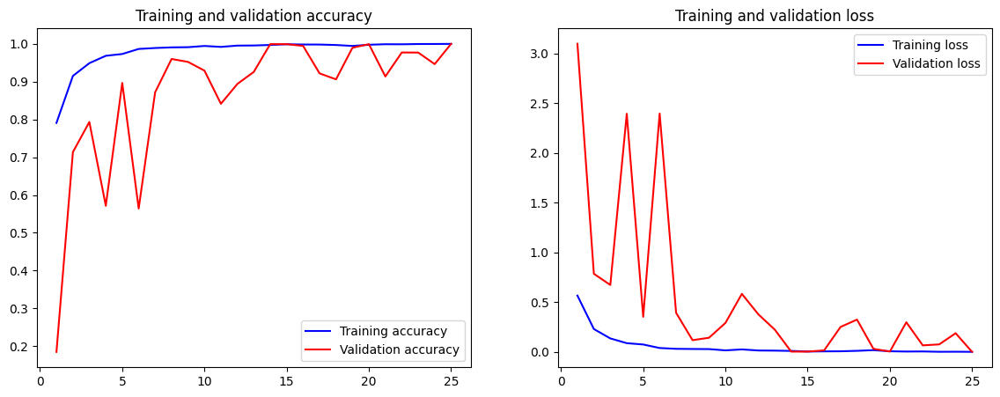

In [18]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy and loss
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'b', label='Training accuracy')
    plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()

# Call the function to plot
plot_training_history(history)


35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 295ms/step


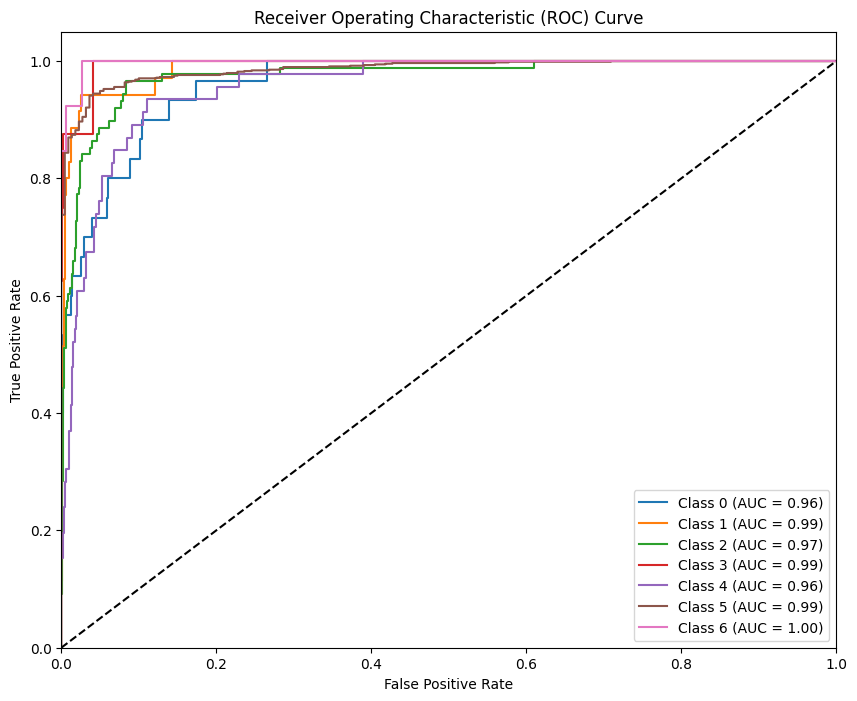

In [19]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np

# Get true labels and predicted probabilities
y_true = test_generator.classes
y_pred = model.predict(test_generator)
n_classes = train_generator.num_classes

# Binarize the labels for ROC curve
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# Calculate ROC curve and AUC for each class
fpr = {}
tpr = {}
roc_auc = {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


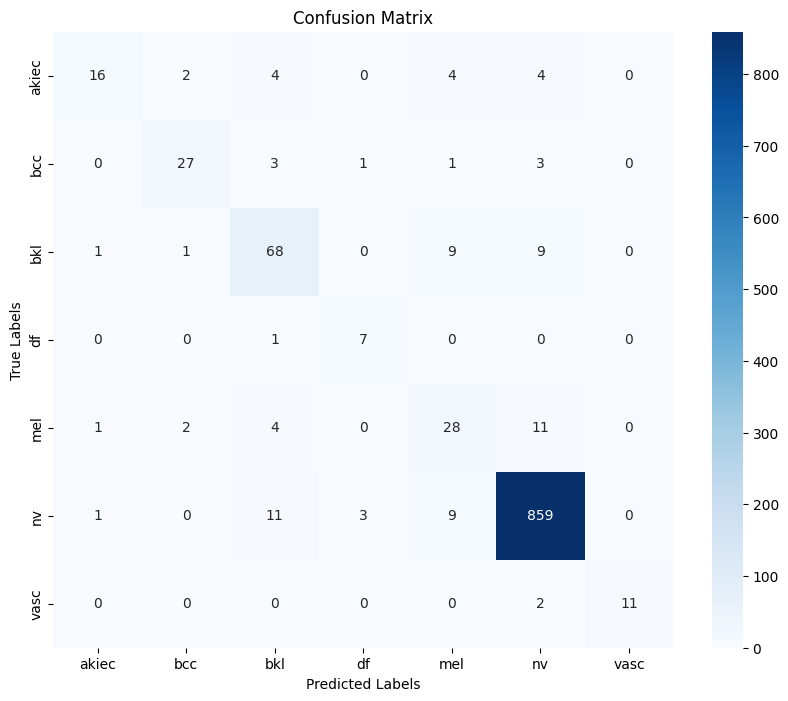

In [20]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Get predictions
y_pred_classes = np.argmax(y_pred, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=val_generator.class_indices.keys(),
            yticklabels=val_generator.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


**Testing on the unbalanced ham10000**

In [22]:
import pandas as pd

In [23]:
df=pd.read_csv("/kaggle/input/ham1000-segmentation-and-classification/GroundTruth.csv")

In [24]:
df.head()

,image,MEL,NV,BCC,AKIEC,BKL,DF,VASC
0,ISIC_0024306,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,ISIC_0024307,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,ISIC_0024308,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,ISIC_0024309,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,ISIC_0024310,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [39]:
import pandas as pd
import os



# Set the directory where your images are stored
image_dir = '/kaggle/input/ham1000-segmentation-and-classification/images'

# Add a new column with the complete image path
df['image_path'] = df['image'].apply(lambda x: os.path.join(image_dir, x + '.jpg'))

# Display the updated DataFrame (optional)
print(df.head())


          image  MEL   NV  BCC  AKIEC  BKL   DF  VASC  \
0  ISIC_0024306  0.0  1.0  0.0    0.0  0.0  0.0   0.0   
1  ISIC_0024307  0.0  1.0  0.0    0.0  0.0  0.0   0.0   
2  ISIC_0024308  0.0  1.0  0.0    0.0  0.0  0.0   0.0   
3  ISIC_0024309  0.0  1.0  0.0    0.0  0.0  0.0   0.0   
4  ISIC_0024310  1.0  0.0  0.0    0.0  0.0  0.0   0.0   

                                          image_path  
0  /kaggle/input/ham1000-segmentation-and-classif...  
1  /kaggle/input/ham1000-segmentation-and-classif...  
2  /kaggle/input/ham1000-segmentation-and-classif...  
3  /kaggle/input/ham1000-segmentation-and-classif...  
4  /kaggle/input/ham1000-segmentation-and-classif...  


In [41]:
import os
import shutil
import pandas as pd
label_columns = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Define the target directory where you want to organize the images
target_dir = '/kaggle/working/data/train/'  # Adjust this path as needed

# Create the main target directory if it doesn't exist
os.makedirs(target_dir, exist_ok=True)

# Iterate over each row of the DataFrame
for index, row in df.iterrows():
    image_path = row['image_path']  # Get the path to the image
    
    # Find the label where the value is 1, indicating the class for this image
    assigned_label = None
    for label in label_columns:
        if row[label] == 1:
            assigned_label = label.upper()
            break  # Stop after finding the first label that is '1', assuming one label per image
    
    if assigned_label is not None:
        # Define the target directory for the current label
        label_dir = os.path.join(target_dir, assigned_label)
        
        # Create the directory for the label if it doesn't exist
        os.makedirs(label_dir, exist_ok=True)
        
        # Define the destination path where the image will be copied/moved
        image_destination = os.path.join(label_dir, os.path.basename(image_path))
        # Copy or move the image to the corresponding directory
        shutil.copy(image_path, image_destination)  # Use shutil.move() if you want to move instead of copy

print("Images have been organized into directories by label.")


Images have been organized into directories by label.


In [43]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_dir_1 = "/kaggle/working/data/train/"


# Load the test dataset
img_size = (224, 224)  # Adjust to your model's input size
batch_size = 32

test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir_1,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',  # Adjust to 'categorical' if using one-hot labels
    shuffle=False
)

Found 10015 images belonging to 7 classes.


In [44]:
# Evaluate on the validation set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy:.2f}")


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


313/313 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.9772 - loss: 0.1502
Test Accuracy: 0.98


313/313 ━━━━━━━━━━━━━━━━━━━━ 61s 195ms/step


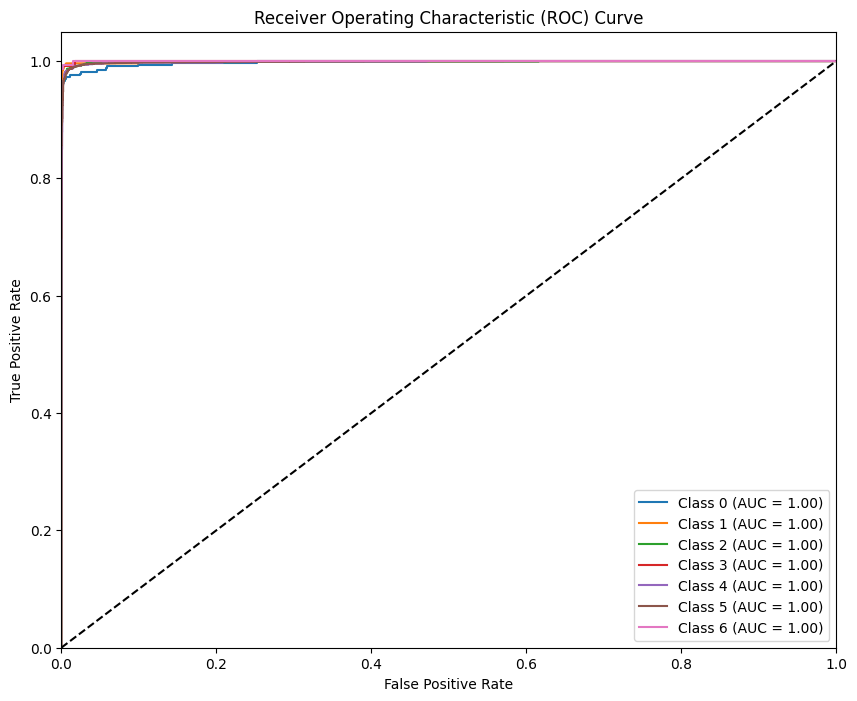

In [45]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np

# Get true labels and predicted probabilities
y_true = test_generator.classes
y_pred = model.predict(test_generator)
n_classes = train_generator.num_classes

# Binarize the labels for ROC curve
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# Calculate ROC curve and AUC for each class
fpr = {}
tpr = {}
roc_auc = {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


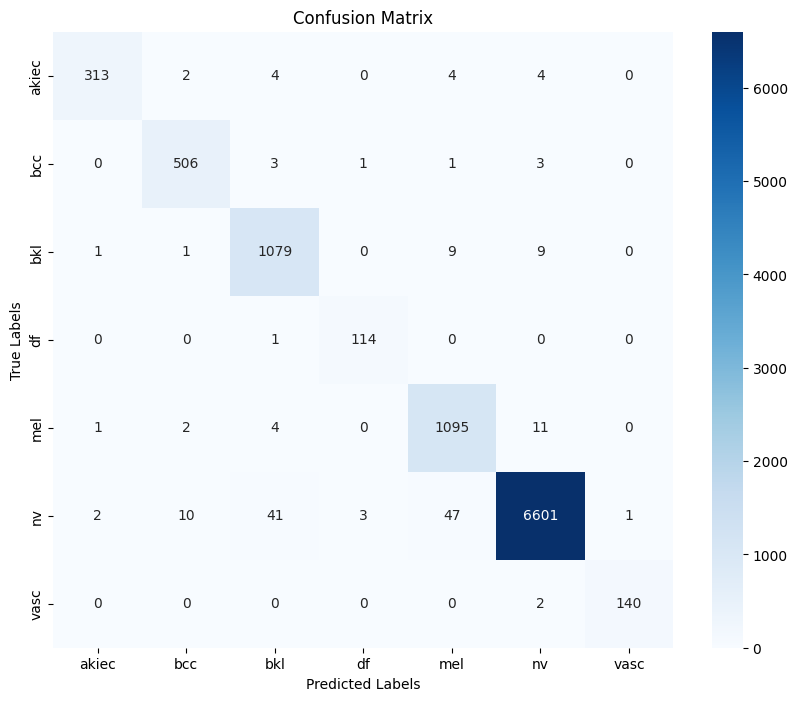

In [46]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Get predictions
y_pred_classes = np.argmax(y_pred, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=val_generator.class_indices.keys(),
            yticklabels=val_generator.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the Squeeze-and-Excitation (SE) Layer
class SqueezeExcite(layers.Layer):
    def __init__(self, in_channels, reduction_ratio=16, **kwargs):
        super(SqueezeExcite, self).__init__(**kwargs)
        self.in_channels = in_channels
        self.reduction_ratio = reduction_ratio
        self.global_avg_pool = layers.GlobalAveragePooling2D()
        self.dense1 = layers.Dense(in_channels // reduction_ratio, activation='relu')
        self.dense2 = layers.Dense(in_channels, activation='sigmoid')

    def call(self, x):
        # Global Average Pooling
        se = self.global_avg_pool(x)
        se = tf.expand_dims(tf.expand_dims(se, 1), 1)  # Add spatial dimensions for broadcasting
        # Fully connected layers with ReLU and sigmoid
        se = self.dense1(se)
        se = self.dense2(se)
        return x * se  # Scale the input by the channel attention map

    def get_config(self):
        config = super(SqueezeExcite, self).get_config()
        config.update({
            "in_channels": self.in_channels,
            "reduction_ratio": self.reduction_ratio
        })
        return config

# Paths to the directories
train_dir = '/kaggle/input/ham-10000balanced/train_dir'
val_dir = '/kaggle/input/ham-10000balanced/test_dir'  # Directory for validation/test data

# Parameters
BATCH_SIZE = 32
IMG_SIZE = (224, 224)
num_classes = 7  # Adjust as per the actual number of classes

# Data Generators
train_datagen = ImageDataGenerator(rescale=1.0/255)
val_datagen = ImageDataGenerator(rescale=1.0/255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True  # Shuffle training data
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False  # Do not shuffle validation/test data
)

# Load the EfficientNet model without the top classifier layer
base_model = EfficientNetB0(include_top=False, weights="imagenet", input_shape=IMG_SIZE + (3,))

# Find the number of output channels from the EfficientNet feature map
sample_input = tf.keras.Input(shape=IMG_SIZE + (3,))
feature_map = base_model(sample_input)
in_channels = feature_map.shape[-1]

# Modified EfficientNet model with Squeeze-and-Excitation Layer
def EfficientNet_with_SE(num_classes, reduction_ratio=16):
    inputs = tf.keras.Input(shape=IMG_SIZE + (3,))
    x = base_model(inputs, training=True)  # Extract features with EfficientNet base
    x = SqueezeExcite(in_channels, reduction_ratio=reduction_ratio)(x)  # Add SE layer
    x = layers.GlobalAveragePooling2D()(x)  # Global Average Pooling
    outputs = layers.Dense(num_classes, activation="softmax")(x)  # Classification layer
    model = models.Model(inputs, outputs)
    return model

# Instantiate the modified EfficientNet with SE
model = EfficientNet_with_SE(num_classes=num_classes)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.006, momentum=0.9),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Set up ModelCheckpoint to save the best weights based on validation accuracy
checkpoint_cb = ModelCheckpoint(
    "best.weights.h5",
    monitor="val_accuracy",
    save_best_only=True,
    save_weights_only=True,
    mode="max",
    verbose=1
)

# Train the model
history = model.fit(
    train_generator,
    epochs=10,  # Adjust the number of epochs as needed
    validation_data=val_generator,
    callbacks=[checkpoint_cb]
)


Found 25800 images belonging to 7 classes.
Found 1103 images belonging to 7 classes.
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1731486615.681175     108 service.cc:145] XLA service 0x7f7f3401d290 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731486615.681239     108 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1731486615.681245     108 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1731486657.062789     108 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


366/807 ━━━━━━━━━━━━━━━━━━━━ 2:51 389ms/step - accuracy: 0.5383 - loss: 1.2972

I0000 00:00:1731486799.019419     108 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_multiply_reduce_fusion', 220 bytes spill stores, 220 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion', 24 bytes spill stores, 24 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_2', 24 bytes spill stores, 24 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 32 bytes spill stores, 32 bytes spill loads



512/807 ━━━━━━━━━━━━━━━━━━━━ 1:45 359ms/step - accuracy: 0.5837 - loss: 1.1717

35/35 ━━━━━━━━━━━━━━━━━━━━ 17s 352ms/step


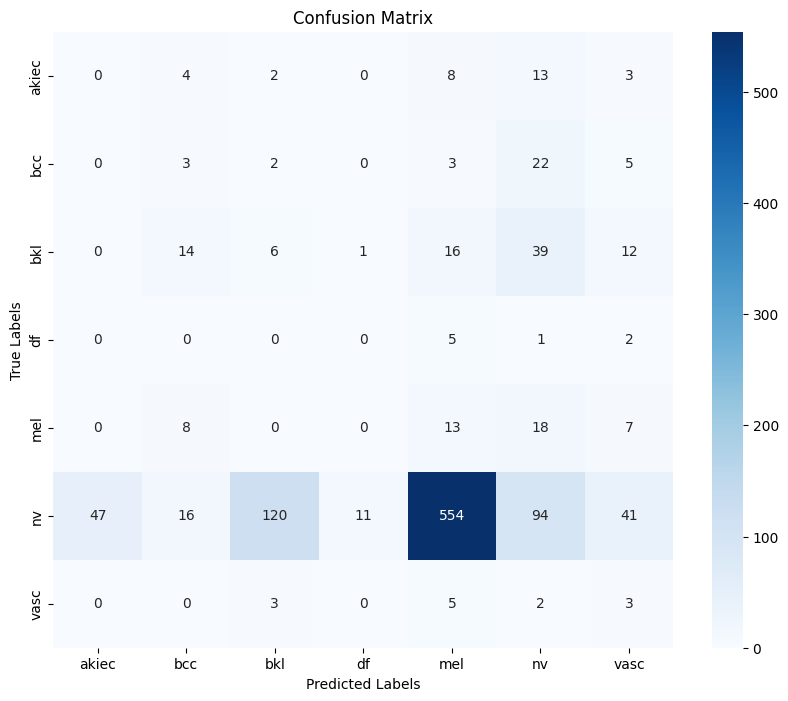

              precision    recall  f1-score   support

       akiec       0.00      0.00      0.00        30
         bcc       0.07      0.09      0.07        35
         bkl       0.05      0.07      0.05        88
          df       0.00      0.00      0.00         8
         mel       0.02      0.28      0.04        46
          nv       0.50      0.11      0.18       883
        vasc       0.04      0.23      0.07        13

    accuracy                           0.11      1103
   macro avg       0.10      0.11      0.06      1103
weighted avg       0.41      0.11      0.15      1103



In [2]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Load the best weights
model.load_weights("best.weights.h5")

# Predict the labels for the test data
y_pred = model.predict(val_generator)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert predictions to class labels

# True labels
y_true = val_generator.classes  # Actual labels from the generator

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=val_generator.class_indices.keys(), yticklabels=val_generator.class_indices.keys())
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Print classification report for detailed metrics
print(classification_report(y_true, y_pred_classes, target_names=val_generator.class_indices.keys()))


In [ ]:
# building an ensemble model using 5 different cnns


Found 25800 images belonging to 7 classes.
Found 1103 images belonging to 7 classes.
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1731549984.902315     107 service.cc:145] XLA service 0x7a1f60002800 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731549984.902359     107 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1731549984.902364     107 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1731550020.627039     107 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


177/807 ━━━━━━━━━━━━━━━━━━━━ 4:47 456ms/step - accuracy: 0.2951 - loss: 1.7564

I0000 00:00:1731550101.045218     105 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_10', 208 bytes spill stores, 208 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_9', 20 bytes spill stores, 20 bytes spill loads



807/807 ━━━━━━━━━━━━━━━━━━━━ 371s 411ms/step - accuracy: 0.4557 - loss: 1.3932
Epoch 2/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 325s 401ms/step - accuracy: 0.8183 - loss: 0.4811
Epoch 4/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 325s 402ms/step - accuracy: 0.8677 - loss: 0.3651
Epoch 5/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 324s 401ms/step - accuracy: 0.8865 - loss: 0.3032
Epoch 6/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 325s 402ms/step - accuracy: 0.9237 - loss: 0.2093
Epoch 8/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 324s 401ms/step - accuracy: 0.9321 - loss: 0.1871
Epoch 9/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 325s 401ms/step - accuracy: 0.9449 - loss: 0.1556
Epoch 10/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 325s 401ms/step - accuracy: 0.9491 - loss: 0.1390
17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
 52/807 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - accuracy: 0.3523 - loss: 1.8096

I0000 00:00:1731553364.636571     108 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_122', 248 bytes spill stores, 248 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_and_reduce_fusion', 284 bytes spill stores, 292 bytes spill loads



807/807 ━━━━━━━━━━━━━━━━━━━━ 106s 106ms/step - accuracy: 0.6759 - loss: 0.8817
Epoch 2/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 80s 99ms/step - accuracy: 0.9109 - loss: 0.2572
Epoch 3/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 79s 97ms/step - accuracy: 0.9598 - loss: 0.1358
Epoch 4/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 80s 98ms/step - accuracy: 0.9790 - loss: 0.0775
Epoch 5/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 80s 98ms/step - accuracy: 0.9896 - loss: 0.0475
Epoch 6/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 77s 94ms/step - accuracy: 0.9937 - loss: 0.0317
Epoch 7/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 84s 96ms/step - accuracy: 0.9961 - loss: 0.0240
Epoch 8/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 80s 98ms/step - accuracy: 0.9974 - loss: 0.0184
Epoch 9/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 78s 96ms/step - accuracy: 0.9982 - loss: 0.0131
Epoch 10/10
162/807 ━━━━━━━━━━━━━━━━━━━━ 3:34 332ms/step - accuracy: 0.3323 - loss: 1.7472

I0000 00:00:1731554270.044056     108 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_multiply_reduce_fusion', 220 bytes spill stores, 220 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion', 24 bytes spill stores, 24 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_2', 24 bytes spill stores, 24 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 32 bytes spill stores, 32 bytes spill loads



807/807 ━━━━━━━━━━━━━━━━━━━━ 193s 165ms/step - accuracy: 0.5388 - loss: 1.2691
Epoch 2/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 99s 122ms/step - accuracy: 0.8076 - loss: 0.5317
Epoch 3/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 99s 122ms/step - accuracy: 0.8617 - loss: 0.3752
Epoch 4/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 99s 122ms/step - accuracy: 0.9018 - loss: 0.2842
Epoch 5/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 99s 122ms/step - accuracy: 0.9224 - loss: 0.2248
Epoch 6/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 99s 122ms/step - accuracy: 0.9425 - loss: 0.1770
Epoch 7/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 142s 123ms/step - accuracy: 0.9509 - loss: 0.1482
Epoch 8/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 99s 122ms/step - accuracy: 0.9572 - loss: 0.1274
Epoch 9/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 99s 122ms/step - accuracy: 0.9673 - loss: 0.1048
Epoch 10/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 99s 122ms/step - accuracy: 0.9662 - loss: 0.1014
74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10


I0000 00:00:1731555503.770800     107 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_51', 4 bytes spill stores, 4 bytes spill loads



724/807 ━━━━━━━━━━━━━━━━━━━━ 37s 449ms/step - accuracy: 0.7187 - loss: 0.7646

I0000 00:00:1731555992.708951     106 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion', 28 bytes spill stores, 28 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_slice_fusion', 788 bytes spill stores, 608 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_slice_fusion_1', 80 bytes spill stores, 80 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_slice_fusion', 48 bytes spill stores, 48 bytes spill loads



807/807 ━━━━━━━━━━━━━━━━━━━━ 738s 652ms/step - accuracy: 0.7305 - loss: 0.7334
Epoch 2/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 356s 440ms/step - accuracy: 0.9541 - loss: 0.1415
Epoch 3/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 356s 440ms/step - accuracy: 0.9791 - loss: 0.0675
Epoch 4/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 356s 440ms/step - accuracy: 0.9900 - loss: 0.0356
Epoch 5/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 356s 440ms/step - accuracy: 0.9951 - loss: 0.0221
Epoch 6/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 356s 440ms/step - accuracy: 0.9952 - loss: 0.0180
Epoch 7/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 355s 439ms/step - accuracy: 0.9970 - loss: 0.0122
Epoch 8/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 356s 440ms/step - accuracy: 0.9980 - loss: 0.0078
Epoch 9/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 356s 440ms/step - accuracy: 0.9978 - loss: 0.0081
Epoch 10/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 355s 439ms/step - accuracy: 0.9986 - loss: 0.0065
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
754/807 ━━━━━━━━━━━━━━━━━━━━ 14s 269ms/step - ac

I0000 00:00:1731559492.122327     106 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_add_reduce_fusion_48', 168 bytes spill stores, 168 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion', 28 bytes spill stores, 28 bytes spill loads



807/807 ━━━━━━━━━━━━━━━━━━━━ 273s 289ms/step - accuracy: 0.7071 - loss: 0.7935
Epoch 2/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 218s 269ms/step - accuracy: 0.9419 - loss: 0.1718
Epoch 3/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 218s 269ms/step - accuracy: 0.9696 - loss: 0.0861
Epoch 4/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 218s 269ms/step - accuracy: 0.9872 - loss: 0.0450
Epoch 5/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 218s 269ms/step - accuracy: 0.9921 - loss: 0.0286
Epoch 6/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 218s 269ms/step - accuracy: 0.9964 - loss: 0.0166
Epoch 7/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 218s 269ms/step - accuracy: 0.9967 - loss: 0.0132
Epoch 8/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 218s 269ms/step - accuracy: 0.9974 - loss: 0.0105
Epoch 9/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 218s 269ms/step - accuracy: 0.9982 - loss: 0.0080
Epoch 10/10
807/807 ━━━━━━━━━━━━━━━━━━━━ 218s 269ms/step - accuracy: 0.9984 - loss: 0.0073
35/35 ━━━━━━━━━━━━━━━━━━━━ 23s 647ms/step
35/35 ━━━━━━━━━━━━━━━━━━━━ 11s 284ms/step
35/35 ━━━━━━━━━━━━━━━━━━━━

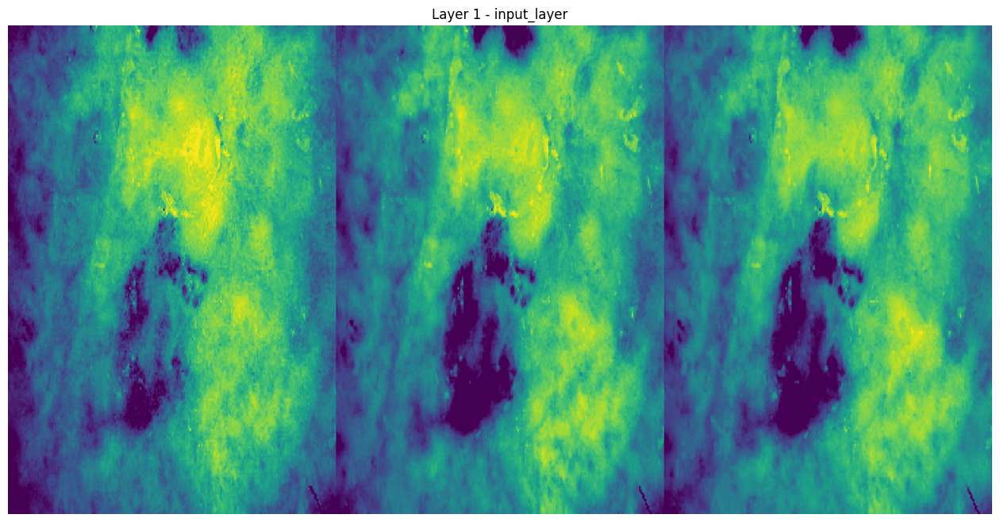

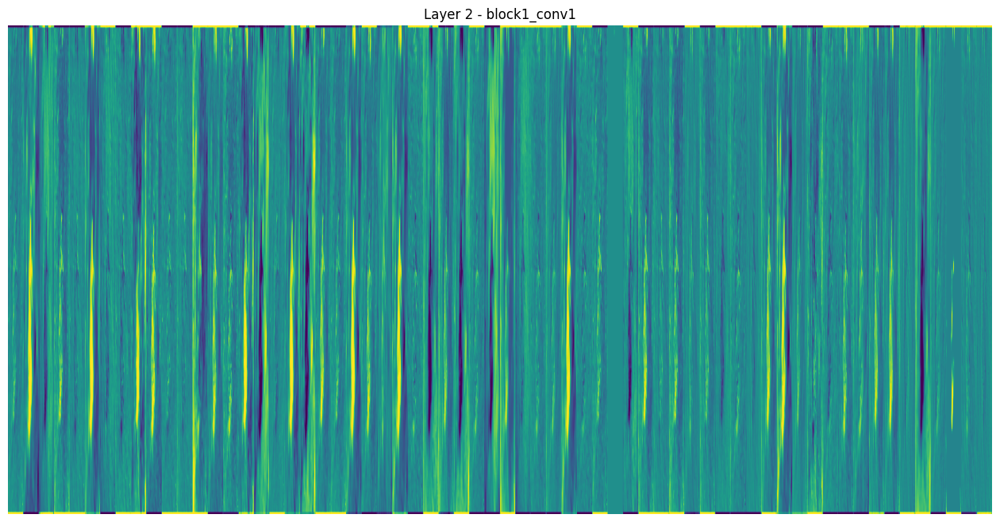

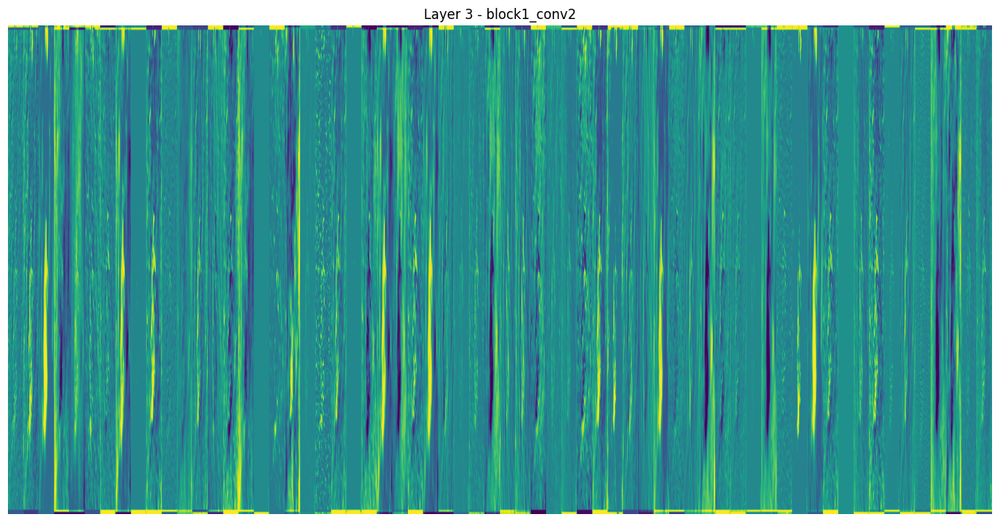

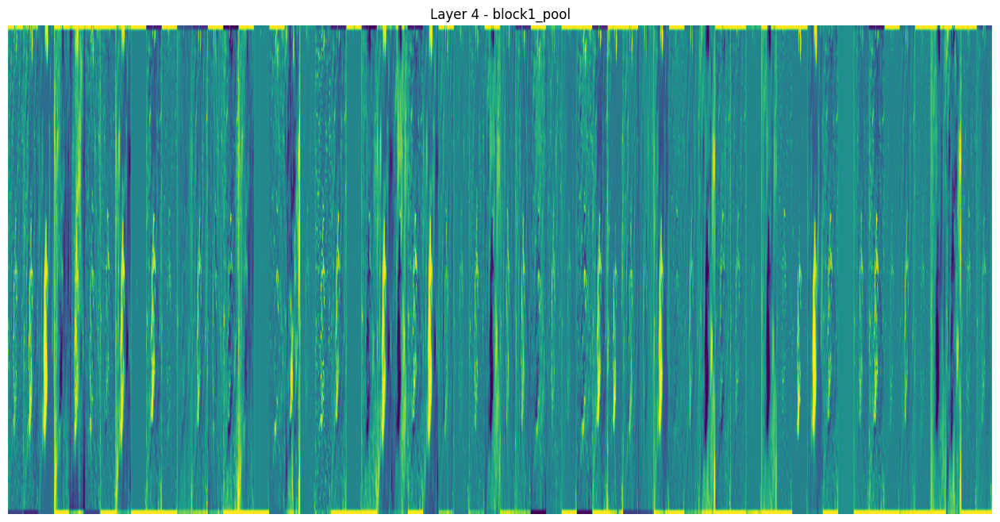

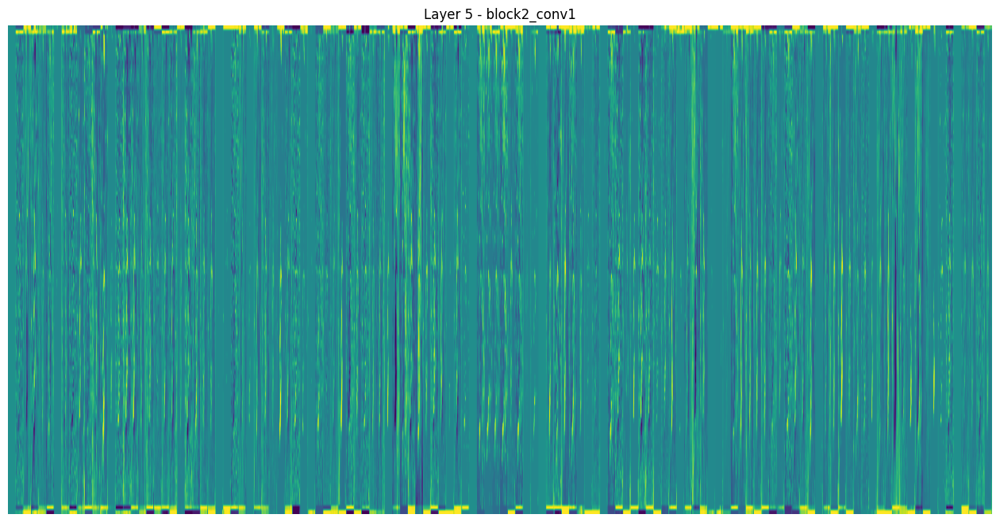

...

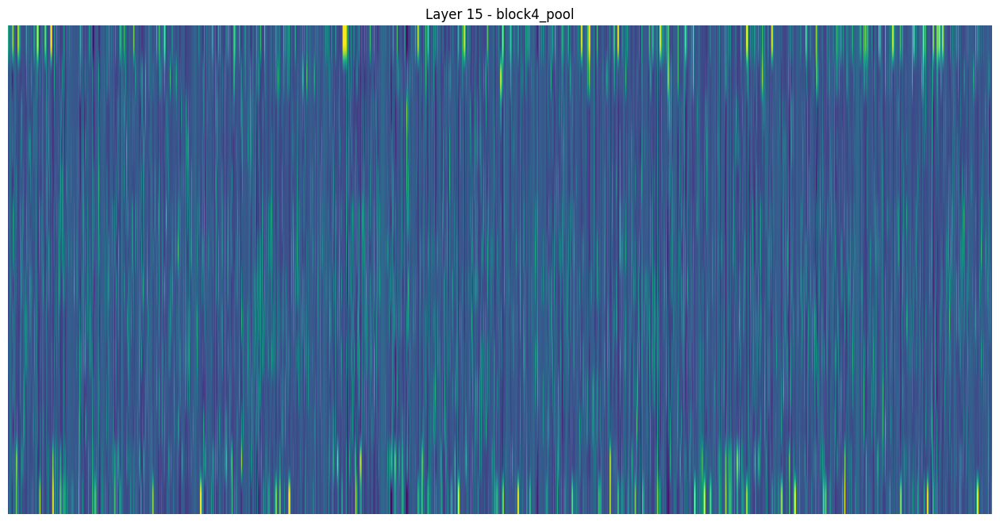

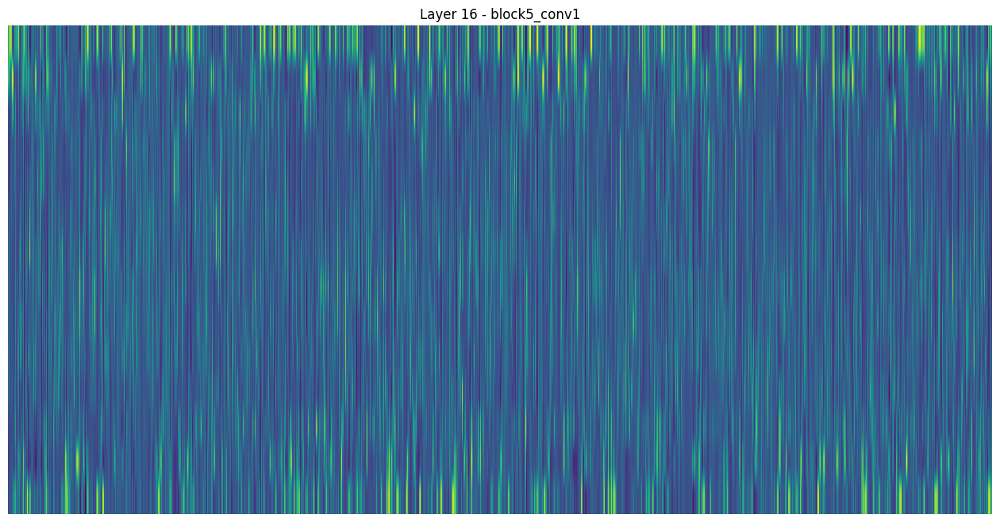

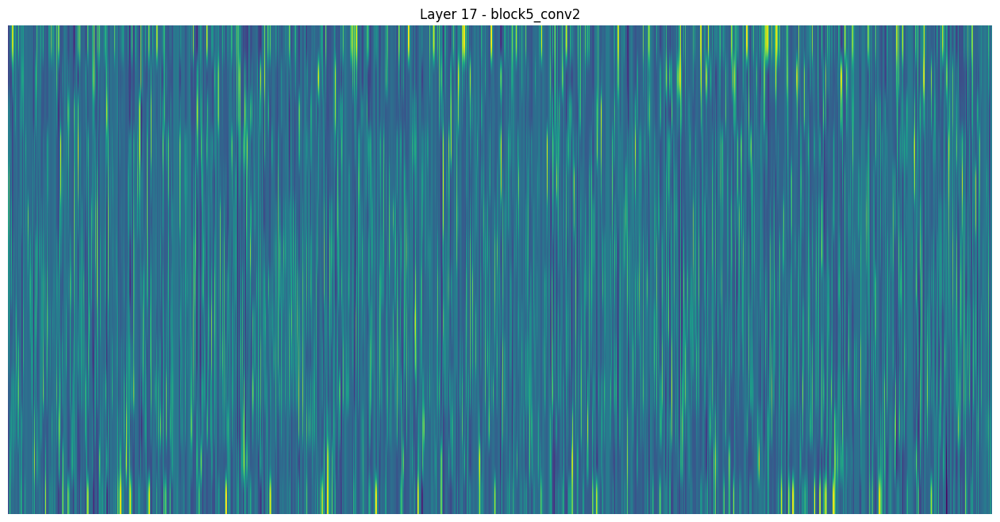

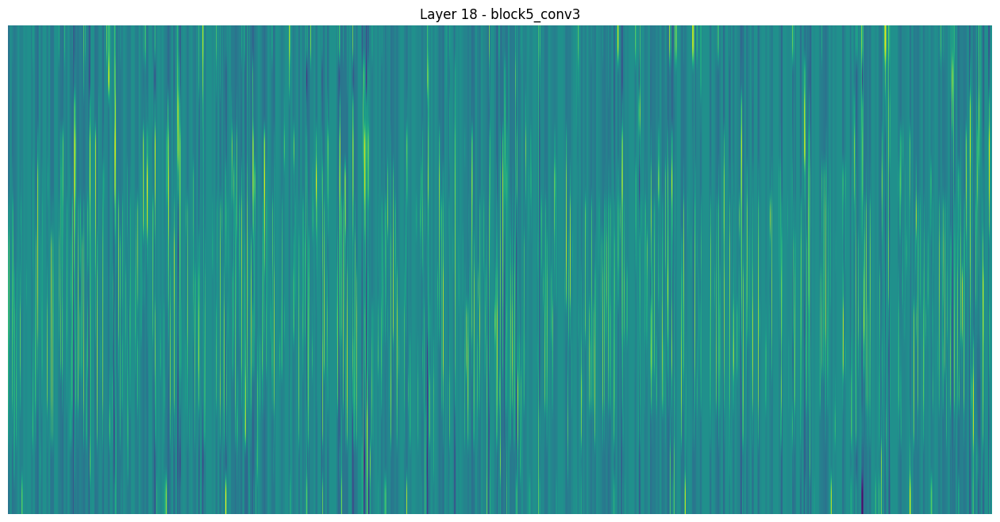

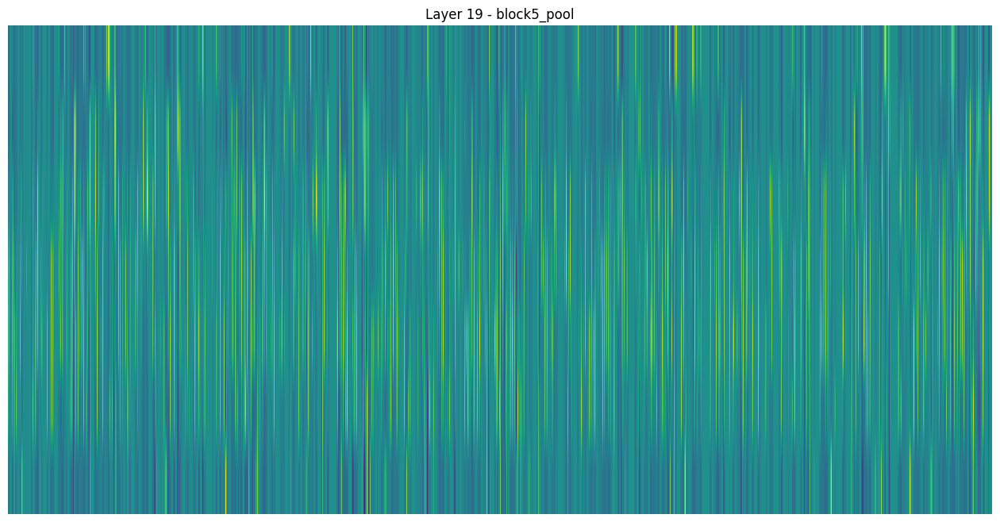

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16, MobileNet, EfficientNetB0, DenseNet201, ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, accuracy_score

# Set parameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
NUM_CLASSES = 7
EPOCHS = 10  # Adjust based on requirements

def load_data(train_dir, test_dir):
    """
    Load training and testing data using Keras ImageDataGenerator.
    Returns train and test data generators.
    """
    train_datagen = ImageDataGenerator(
        rescale=1./255
        
    )
    test_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True
    )

    test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )

    return train_generator, test_generator

def build_cnn_model(base_model_class, num_classes=NUM_CLASSES):
    """
    Build a CNN model by adding classification layers to a base model.
    Freezes base layers to retain pretrained features.
    """
    base_model = base_model_class(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=output)

    # Freeze the convolutional base layers
    for layer in base_model.layers:
        layer.trainable = True

    return model

def train_model(model, train_generator, epochs=EPOCHS):
    """
    Compile and train a given model.
    """
    
    model.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])
    model.fit(train_generator, epochs=epochs)
    return model

def calculate_weights(models, test_generator):
    """
    Calculate weights for each model based on their accuracy on the test set.
    Higher accuracy will yield a higher weight.
    """
    weights = []
    for model in models:
        preds = np.argmax(model.predict(test_generator), axis=1)
        accuracy = accuracy_score(test_generator.classes, preds)
        weights.append(accuracy)
    
    # Normalize weights to sum to 1
    weights = np.array(weights)
    weights = weights / weights.sum()
    return weights

def build_ensemble(predictions, weights=None):
    """
    Generate ensemble predictions by combining predictions from multiple models using different methods.
    
    Parameters:
    - predictions: List of predictions from each model.
    - weights: Array of weights if using weighted average ensemble.
    
    Returns:
    - mean_ensemble: Ensemble prediction using mean of predictions.
    - median_ensemble: Ensemble prediction using median of predictions.
    - soft_vote_ensemble: Ensemble prediction using summed probabilities (soft voting).
    - weighted_ensemble: Ensemble prediction using weighted average (requires weights).
    """
    # Calculate the mean ensemble
    mean_ensemble = np.mean(predictions, axis=0)
    
    # Calculate the median ensemble
    median_ensemble = np.median(predictions, axis=0)
    
    # Calculate the soft voting ensemble
    soft_vote_ensemble = np.sum(predictions, axis=0)
    
    # Calculate the weighted ensemble, if weights are provided
    if weights is not None:
        weighted_preds = [w * pred for w, pred in zip(weights, predictions)]
        weighted_ensemble = np.sum(weighted_preds, axis=0)
    else:
        weighted_ensemble = None

    return mean_ensemble, median_ensemble, soft_vote_ensemble, weighted_ensemble

def display_layer_outputs(model, image):
    """
    Display outputs of each layer for a given input image.
    """
    import matplotlib.pyplot as plt

    layer_outputs = [layer.output for layer in model.layers]
    activation_model = Model(inputs=model.input, outputs=layer_outputs)
    activations = activation_model.predict(image)

    for i, activation in enumerate(activations):
        if len(activation.shape) == 4:  # Only display activations with spatial dimensions
            plt.figure(figsize=(16, 8))
            plt.title(f'Layer {i+1} - {model.layers[i].name}')
            n_features = activation.shape[-1]
            size = activation.shape[1]
            display_grid = np.zeros((size, size * n_features))
            for j in range(n_features):
                x = activation[0, :, :, j]
                x -= x.mean()
                x /= x.std() + 1e-5
                x *= 64
                x += 128
                x = np.clip(x, 0, 255).astype('uint8')
                display_grid[:, j * size: (j + 1) * size] = x
            plt.imshow(display_grid, aspect='auto', cmap='viridis')
            plt.axis('off')
            plt.show()

def main():
    """
    Main function to execute the training and ensemble prediction.
    """
    # Load the data
    train_generator, test_generator = load_data('/kaggle/input/ham-10000balanced/train_dir', '/kaggle/input/ham-10000balanced/test_dir')

    # Initialize and train models
    models = []
    model_classes = [VGG16, MobileNet, EfficientNetB0, DenseNet201, ResNet50]
    for model_class in model_classes:
        model = build_cnn_model(model_class)
        trained_model = train_model(model, train_generator)
        models.append(trained_model)

    # Get predictions from each model
    predictions = [model.predict(test_generator) for model in models]

    # Calculate weights based on model accuracy
    weights = calculate_weights(models, test_generator)

    # Ensemble predictions using different methods
    mean_ensemble, median_ensemble, soft_vote_ensemble, weighted_ensemble = build_ensemble(predictions, weights=weights)

    # Evaluate each ensemble method
    ensemble_methods = {
        'Mean Ensemble': mean_ensemble,
        'Median Ensemble': median_ensemble,
        'Soft Vote Ensemble': soft_vote_ensemble,
        'Weighted Ensemble': weighted_ensemble
    }

    for method_name, ensemble_pred in ensemble_methods.items():
        if ensemble_pred is not None:  # Skip if weighted ensemble is None
            # Convert predictions to class labels
            ensemble_classes = np.argmax(ensemble_pred, axis=1)
            true_classes = test_generator.classes

            # Evaluate the ensemble model
            print(f"\n=== {method_name} ===")
            print(classification_report(true_classes, ensemble_classes, target_names=test_generator.class_indices.keys()))
            print(f'Ensemble Accuracy ({method_name}): {accuracy_score(true_classes, ensemble_classes)}')

    # Sample visualization of layer outputs
    sample_image, _ = next(test_generator)
    display_layer_outputs(models[0], sample_image[0:1])  # Display for first model and one sample

# Execute the main function
main()
